In [1]:
import datetime as dt
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
def log_return(series):
    log_return = np.log(series / series.shift(1)).dropna()
    return log_return

In [3]:
def log_volume(series):
    log_return = np.log(series / series.shift(1)).dropna()
    return log_return

In [4]:
def bipower_variation(series, rollingWindow=5):
    '''
    Bipower Variation (BV) is the sum of the product of absolute time series returns
    :param column: price column
    :return: returns bivariate variation
    Barnhorf - Nielse & Shephard 2004 & 2006
    '''
    bv = (series.abs() *series.shift(1).abs()).dropna().rolling(rollingWindow).sum()
    
    return bv

In [5]:
def volatility_increments(series):
    theta = np.sqrt(series)
    Vt = (np.log(theta) - np.log(theta.shift(1))).dropna()
    return Vt

In [6]:
#################################################
# codes for implementing DFA-based analysis
# Exploring asymmetric multifractal cross-correlations of price-volatility and asymmetric volatility dynamics in cryptocurrency markets
#################################################
import numpy as np
import math
###########################################
# MF-ADCCA (includes DFA, DCCA, A-DFA, A-DCCA, MFDFA, MFDCCA, A-MFDFA)
##########################################

def dcca(x, y, S, m, Q, trend_base=None, skip_agg=False, asymmetry_base='index'):
    """
        Calculate generalized Hurst Exponenet by Multi Fractal Detrended Cross-correlation Analysis.
        Args:
            x(array(float))  : Target time series data.
            y(array(float))  : Target time series data.
            S(array(int))    : Intervals which divides culmative sum time series. Needs to a positive integer.
            m(int)           : Degree of polynomial fit for each divided segment. Generally, m=2 is recomendend
            Q(array(int))    : fluctuation q-th order.
            trend_base       : designated time series used for defining asymmetric trends.
            skip_agg(bool)   : Whether use cumsum for profile. If series is stationary (ex. log-returns), then "False". If non-stationary (ex. level data), then "True".
                               Its not needed.
            asymmetry_base  : Which criterion used for defining asymmetric trends.
        Returns:
            array(float)     : Return generalized hurst exponent (in np.array) of each Q-th order.
    """
    N = len(x)
    assert len(y) == N, '{} segments'.format(len(y))
    if skip_agg:
        X = np.copy(x)
        Y = np.copy(y)
    else:
        X = np.cumsum(x - np.mean(x))
        Y = np.cumsum(y - np.mean(y))

    def Fvs2(v, s, reverse=False):
        """
            (Root Mean Square) ** 2
            F(s, v)
        """
        Ns = int(N//s)
        ax = np.arange(1, s+1)
        if reverse:
            segment_x = X[N - (v-Ns)*s:N - (v-Ns)*s+s]
            segment_y = Y[N - (v-Ns)*s:N - (v-Ns)*s+s]
        else:
            segment_x = X[(v-1)*s:v*s]
            segment_y = Y[(v-1)*s:v*s]
        coef_x = np.polyfit(ax, segment_x, m)
        coef_y = np.polyfit(ax, segment_y, m)
        fitting_x = np.polyval(coef_x, ax)
        fitting_y = np.polyval(coef_y, ax)
        #return np.mean((segment_x - fitting_x)**2) # DFA for x
        #return np.mean((segment_y - fitting_y)**2) # DFA for y
        return np.mean(np.abs(segment_x - fitting_x)*np.abs(segment_y - fitting_y)) # DCCA for x and y

    if asymmetry_base == 'index':
        """
            Select which set of data series used for dividing its trends
        """
        x_alt = np.exp(np.cumsum(x)) # index-based
    elif asymmetry_base == 'return':
        x_alt = np.copy(x) # return-based
    elif asymmetry_base == 'optional':
        assert type(trend_base) == np.ndarray, 'trend_base is None. designate trend_base.'
        x_alt = np.copy(trend_base) # only for optional. Any series is possible, but desginate trend_base.
    else:
        print('not available: index or return or optional only\nPlease choose either and try again')

    def asym_trend(v, s, reverse=False):
        """
            Detecting trend in some data series H
            L_H(x)=a_H+b_H x
        """
        Ns = int(N//s)
        ax = np.arange(1, s+1)
        if reverse:
            segment = x_alt[N - (v-Ns)*s:N - (v-Ns)*s+s]
        else:
            segment = x_alt[(v-1)*s:v*s]
        coef = np.polyfit(ax, segment, 1) # m=1, y=ax+b (a,b)
        return coef[0] # represents a in y=ax+b

    Fhq = np.zeros(len(Q))
    Fhq_plus = np.zeros(len(Q))
    Fhq_minus = np.zeros(len(Q))
    
    for i, q in enumerate(Q):
        Fqs = np.zeros(len(S))
        Fqs_plus = np.zeros(len(S))
        Fqs_minus = np.zeros(len(S))

        for j, s in enumerate(S):
            Ns = int(N//s)
            segs = np.array([
                [Fvs2(v, s) for v in range(1, Ns + 1)],
                [Fvs2(v, s, reverse=True) for v in range(Ns+1, 2 * Ns + 1)]
            ]).reshape(-1)

            assert len(segs) == 2 * Ns, '{} segments'.format(len(segs))

            trend_segs = np.array([
                [asym_trend(v, s) for v in range(1, Ns + 1)],
                [asym_trend(v, s, reverse=True) for v in range(Ns+1, 2 * Ns + 1)]
            ]).reshape(-1)

            assert len(trend_segs) == 2 * Ns, '{} segments'.format(len(trend_segs))

            M_plus = np.sum((1+np.sign(trend_segs))/2)
            M_minus = np.sum((1-np.sign(trend_segs))/2)

            # calculate qth fluctuation function
            if q == 0:
                # asymmetric version
                Fqs_plus[j] = np.exp((np.sum(((1+np.sign(trend_segs))/2)*np.log(segs))/M_plus)/2)
                Fqs_minus[j] = np.exp((np.sum(((1-np.sign(trend_segs))/2)*np.log(segs))/M_minus)/2)
                # overall
                Fqs[j] = np.exp(np.mean(np.log(segs))/2)
            else:
                # asymmetric version
                Fqs_plus[j] = (np.sum(((1+np.sign(trend_segs))/2)*(segs ** (q/2))) /M_plus)**(1/q)
                Fqs_minus[j] = (np.sum(((1-np.sign(trend_segs))/2)*(segs ** (q/2)))/M_minus)**(1/q)
                # overall version
                Fqs[j] = np.mean(segs ** (q/2)) ** (1/q)
        
        coef_plus = np.polyfit(np.log(S), np.log(Fqs_plus), 1)
        coef_minus = np.polyfit(np.log(S), np.log(Fqs_minus), 1)
        coef = np.polyfit(np.log(S), np.log(Fqs), 1)
        Fhq_plus[i] = coef_plus[0]
        Fhq_minus[i] = coef_minus[0]
        Fhq[i] = coef[0]

    # 1~2: estimates for overall trend, 4~5: estimates for positive trend, 7~8: estimates for negative trend
    # S: scales, Fqs: fluctuation functions, Fhq: generalized hurst exponent
    return S, Fqs, Fhq, S, Fqs_plus, Fhq_plus, S, Fqs_minus, Fhq_minus

def basic_dcca(x, y, Q, m=2, trend_base=None, skip_agg=False, observations=100, asymmetry_base='index'):
    """
        polynominal fitting is set to m = 2 at defalt
    """
    N = len(x)
    s_min = max(20, int(np.floor(N/100)))
    s_max = min(20*s_min, int(np.floor(N/10)))
    s_inc = (s_max - s_min) / (observations-1)
    S = [s_min + int(np.floor(i*s_inc)) for i in range(0, observations)]
    return dcca(x, y, S=S, m=m, Q=Q, trend_base=trend_base, skip_agg=skip_agg, asymmetry_base=asymmetry_base)

In [7]:
def MFADCCA_Hurst(X, Y, T=252, step=1, Q=np.array([2]), trend_base=None, skip_agg=False, observations=100, asymmetry_base='return'):
    X = np.array(X)
    nX = X.shape[0]
    hurst = np.zeros(nX-T+1)
    hurst_plus = np.zeros(nX-T+1)
    hurst_minus = np.zeros(nX-T+1)
    for i in range(0, nX-T+1, step):
        XX = X[i:i+T]
        YY = Y[i:i+T]
        MFADCCA_Hurst = basic_dcca(XX, YY, Q=Q, trend_base=trend_base, skip_agg=skip_agg, observations=observations, asymmetry_base=asymmetry_base)
        hurst[i] = MFADCCA_Hurst[2]
        hurst_plus[i] = MFADCCA_Hurst[5]
        hurst_minus[i] = MFADCCA_Hurst[8]
    #return hurst
    return hurst, hurst_plus,hurst_minus

In [8]:
# read data_set and split them
dataset = pd.read_csv(r"./Datasets/NASDAQ/NASDAQ_QPL.csv")
df = dataset.reset_index(drop=True)
df = df.head(2515)

Close = df['Close']
Volume = df['vol']
# compute Log return and bipower variation for MFADCCA
LogReturn = log_return(Close)         # X
Bv = bipower_variation(LogReturn)     # Y
Vt = volatility_increments(Bv)
vol =  log_volume(Volume) 

Q = np.array([2])

df['log_returns'] = LogReturn         # add to df
df['volatility_increments'] = Vt
df['log_volumes'] = vol

In [9]:
data = df.dropna(axis=0, how='any')

r = data["log_returns"]
v = data["volatility_increments"]
vol = data['log_volumes']

data

,Date,Open,High,Low,Close,QPLp1,QPLp2,QPLp3,QPLp4,QPLp5,...,QPLn16,QPLn17,QPLn18,QPLn19,QPLn20,QPLn21,vol,log_returns,volatility_increments,log_volumes
7,2010/1/13,2289.46,2313.03,2274.12,2307.90,2294.528334,2306.437499,2321.226596,2337.830840,2355.902487,...,2003.495905,1982.460647,1961.464540,1940.533655,1919.690985,1898.956814,614.78,0.011150,0.701793,-0.026580
8,2010/1/14,2303.31,2322.56,2303.29,2316.74,2308.408995,2320.390204,2335.268767,2351.973457,2370.154428,...,2015.615976,1994.453466,1973.330344,1952.272838,1931.304082,1910.444480,617.56,0.003823,0.096539,0.004512
9,2010/1/15,2316.98,2322.54,2279.20,2287.99,2322.109257,2334.161574,2349.128440,2365.932272,2384.221146,...,2027.578530,2006.290422,1985.041936,1963.859455,1942.766250,1921.782847,819.10,-0.012487,0.086757,0.282430
10,2010/1/19,2291.02,2320.40,2290.68,2320.40,2296.091787,2308.009067,2322.808242,2339.423799,2357.507760,...,2004.861054,1983.811462,1962.801050,1941.855902,1920.999031,1900.250731,573.97,0.014066,0.227327,-0.355629
11,2010/1/20,2304.31,2304.47,2268.68,2291.25,2309.411208,2321.397619,2336.282642,2352.994585,2371.183449,...,2016.491072,1995.319373,1974.187081,1953.120433,1932.142573,1911.273914,657.47,-0.012642,0.147697,0.135822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,2017/12/20,6991.26,6991.26,6935.42,6960.96,7006.737029,7043.103715,7088.264767,7138.968682,7194.153565,...,6118.019437,6053.784657,5989.669434,5925.753374,5862.106697,5798.791336,442.66,-0.000415,-0.005171,-0.151171
2007,2017/12/21,6972.88,6992.63,6961.20,6965.36,6988.316340,7024.587418,7069.629742,7120.200356,7175.240158,...,6101.935184,6037.869277,5973.922612,5910.174588,5846.695237,5783.546332,436.63,0.000632,-0.015317,-0.013716
2008,2017/12/22,6958.02,6962.26,6944.44,6959.96,6973.423444,7009.617223,7054.563557,7105.026400,7159.948906,...,6088.931266,6025.001891,5961.191504,5897.579334,5834.235265,5771.220938,372.94,-0.000776,-0.105539,-0.157669
2009,2017/12/26,6928.92,6942.14,6915.56,6936.25,6944.259023,6980.301432,7025.059790,7075.311586,7130.004394,...,6063.465990,5999.803982,5936.260464,5872.914335,5809.835185,5747.084398,322.15,-0.003412,-0.586730,-0.146400


In [10]:
hurst, hurst_plus, hurst_minus = MFADCCA_Hurst(r, vol, T=256, step=1, Q=Q, trend_base=None, skip_agg=False, observations=100, asymmetry_base='return')

In [12]:
hurst.shape

(1749,)

In [13]:
data['hurst'] = pd.DataFrame(np.array([0] * 1749))
data['hurstp'] = pd.DataFrame(np.array([0] * 1749))
data['hurstm'] = pd.DataFrame(np.array([0] * 1749))

data = data.tail(1749)

data['hurst'] = hurst
data['hurstp'] = hurst_plus
data['hurstm'] = hurst_minus
data = data.reset_index(drop = True)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_41796\701051769.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['hurst'] = pd.DataFrame(np.array([0] * 1749))
C:\Users\Administrator\AppData\Local\Temp\ipykernel_41796\701051769.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['hurstp'] = pd.DataFrame(np.array([0] * 1749))
C:\Users\Administrator\AppData\Local\Temp\ipykernel_41796\701051769.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [14]:
data.to_csv(r'./Datasets/NASDAQ/NASDAQ_MFADCCA.csv')

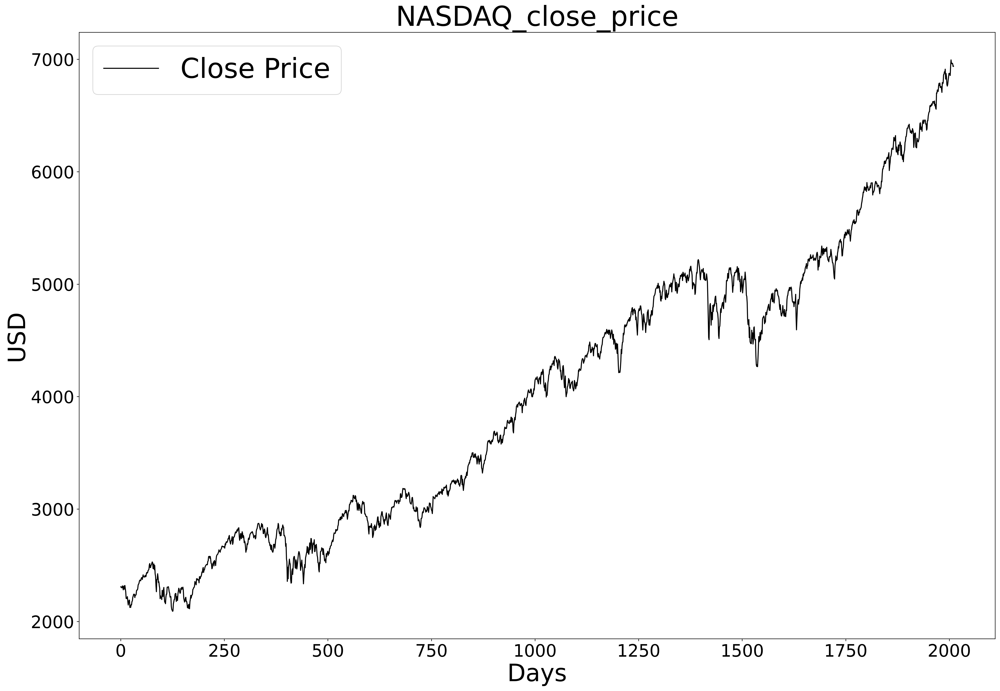

In [15]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(Close,color='k')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('USD', fontsize=35)
plt.title('NASDAQ_close_price', fontsize=40)
plt.legend(['Close Price'],fontsize=40)
plt.savefig('./pic/NASDAQ_pic/NASDAQ_close.png')
plt.show()

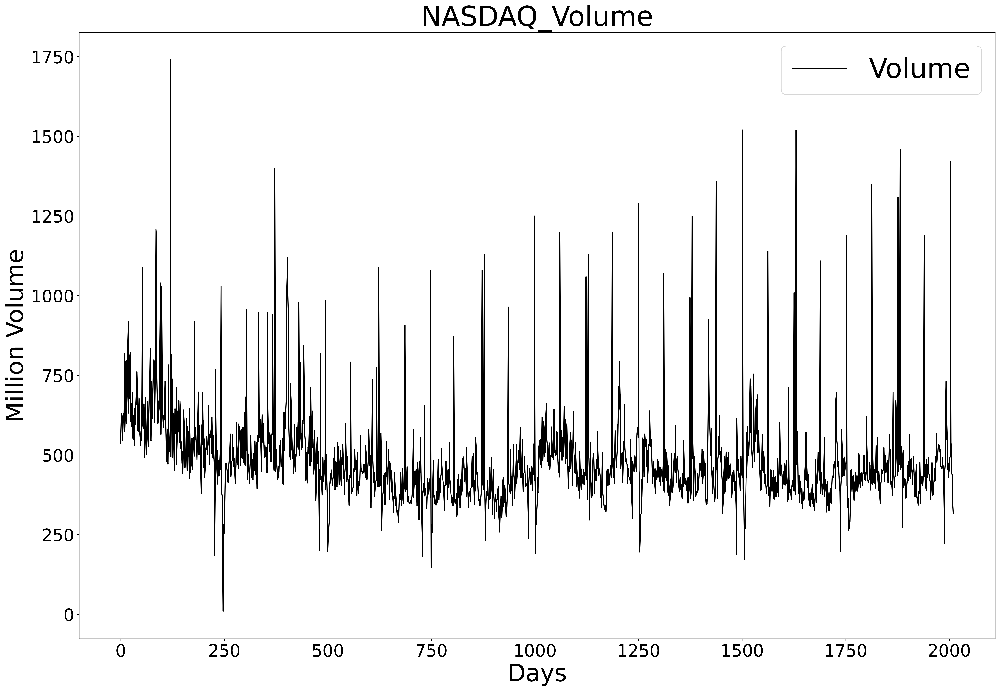

In [17]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(Volume,color='k')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('Million Volume', fontsize=35)
plt.title('NASDAQ_Volume', fontsize=40)
plt.legend(['Volume'],fontsize=40)
plt.savefig('./pic/NASDAQ_pic/NASDAQ_volume.png')
plt.show()

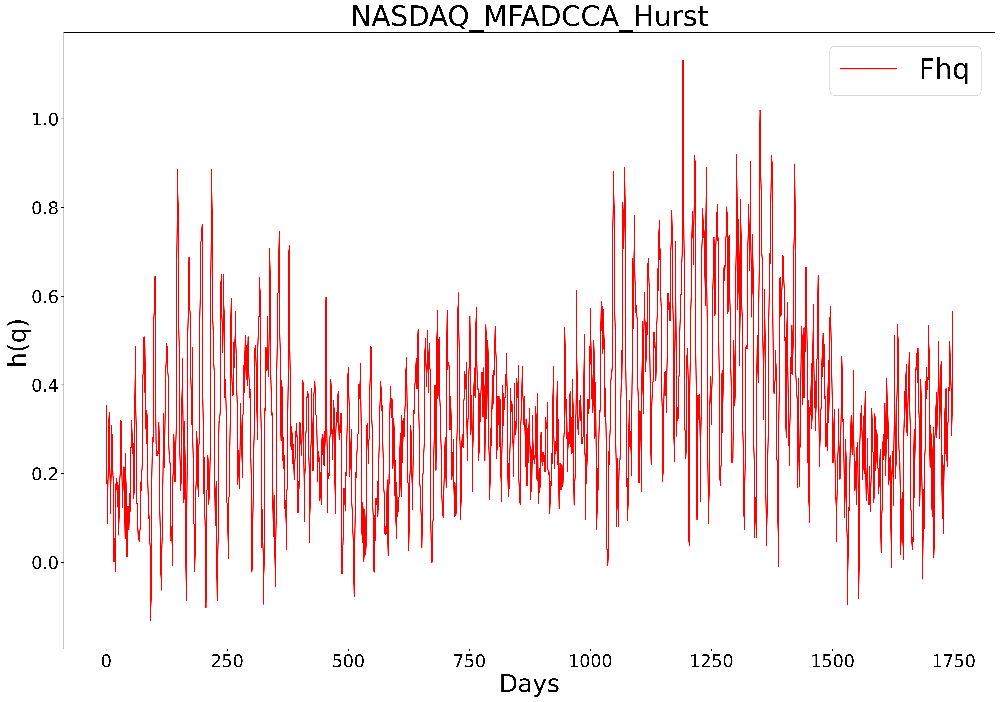

In [24]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(hurst,color='r')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('h(q)', fontsize=35)
plt.title('NASDAQ_MFADCCA_Hurst', fontsize=40)
plt.legend(['Fhq'],fontsize=40)
plt.savefig('./pic/NASDAQ_pic/NASDAQ_MFADCCA_hurst.png')
plt.show()

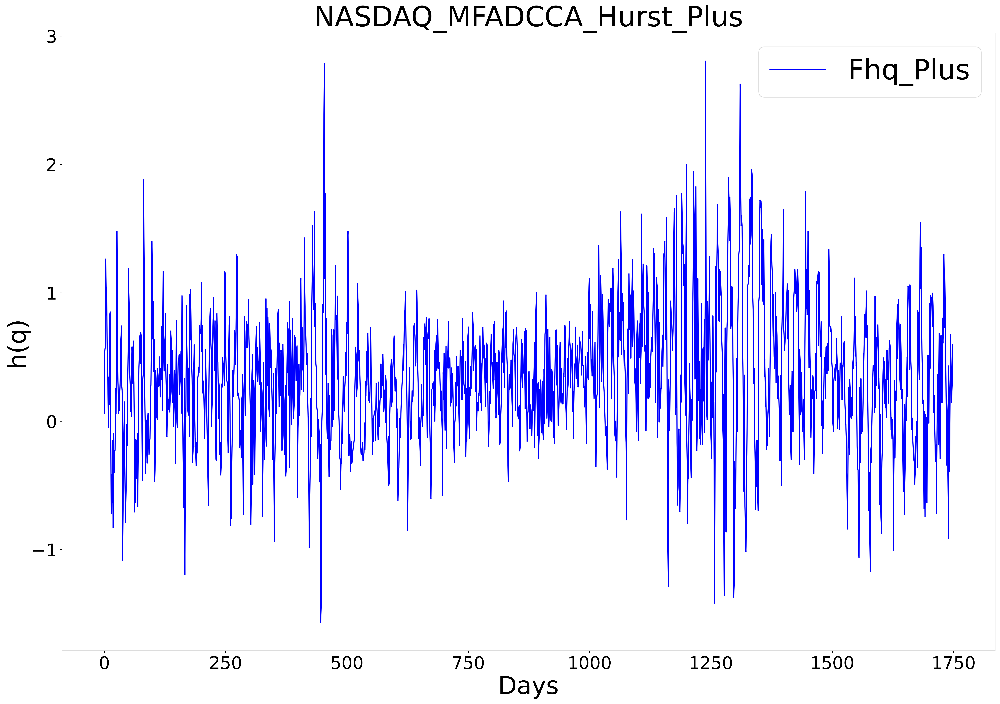

In [20]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(hurst_plus,color='b')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('h(q)', fontsize=35)
plt.title('NASDAQ_MFADCCA_Hurst_Plus', fontsize=40)
plt.legend(['Fhq_Plus'],fontsize=40)
plt.savefig('./pic/NASDAQ_pic/NASDAQ_MFADCCA_hurstplus.png')
plt.show()

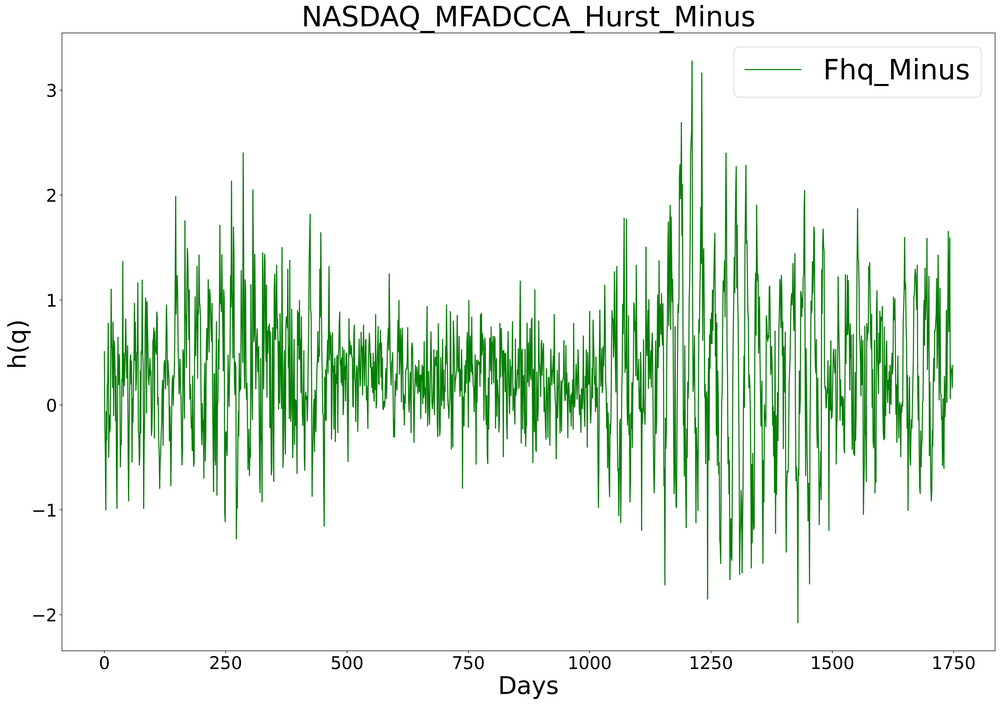

In [22]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(hurst_minus,color='g')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('h(q)', fontsize=35)
plt.title('NASDAQ_MFADCCA_Hurst_Minus', fontsize=40)
plt.legend(['Fhq_Minus'],fontsize=40)
plt.savefig('./pic/NASDAQ_pic/NASDAQ_MFADCCA_hurstminus.png')
plt.show()

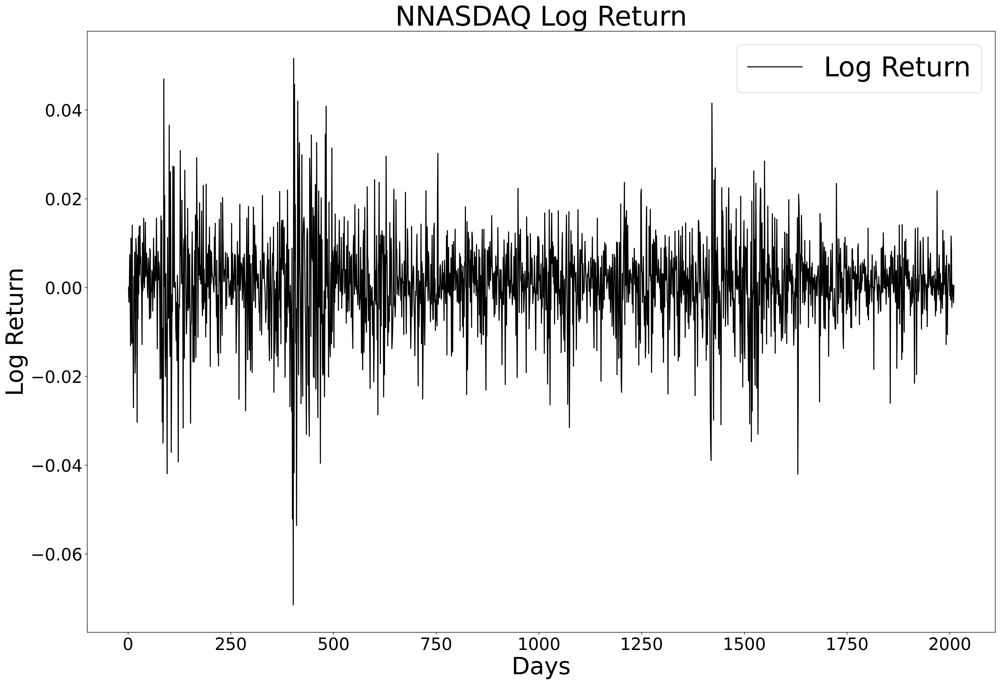

In [23]:
plt.figure(figsize=(24, 16), dpi=400)
plt.plot(LogReturn,color='k')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('Days', fontsize=35)
plt.ylabel('Log Return', fontsize=35)
plt.title('NNASDAQ Log Return', fontsize=40)
plt.legend(['Log Return'],fontsize=40)
plt.savefig('./pic/NASDAQ_pic/NASDAQ_logreturn.png')
plt.show()